### Imports Librerías

In [5]:
# TF 2.13
import tensorflow as tf
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from typing import Tuple, Dict
import numpy as np
import math

import tensorflow.keras.applications.efficientnet_v2 as effnV2
from tensorflow.keras.layers import Dense, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, Dropout

### Definición metodos creación del dataset

In [15]:
dict_map_class = {
    'Loose Silky-bent': 0,
    'Common Chickweed': 1,
    'Scentless Mayweed': 2,
    'Small-flowered Cranesbill': 3,
    'Fat Hen': 4,
    'Charlock': 5,
    'Sugar beet': 6,
    'Cleavers': 7,
    'Black-grass': 8,
    'Shepherds Purse': 9,
    'Common wheat': 10,
    'Maize': 11,   
}

dict_map_class_inverted = {v: k for k, v in dict_map_class.items()}

def get_dict_dataset(
    dataset_path: str = 'dataset'
):
    """
    Creates a dictionary mapping image paths to tuples containing class and partition.

    Args:
        dataset_path (str): Path to the dataset directory. Defaults to 'dataset'.

    Returns:
        dict: A dictionary where keys are image paths and values are tuples (class, partition).
    """

    dict_dataset = {}

    train_classes = os.listdir(os.path.join(dataset_path, 'train'))

    for train_class in train_classes:
        class_path = os.path.join(dataset_path, 'train', train_class)
        train_imgs = os.listdir(class_path)
        
        # Split Train images to a 80% for a Train Split for each class
        for train_img in train_imgs[:int(len(train_imgs)*0.8)]:
            train_img_path = os.path.join(class_path, train_img)
            dict_dataset[train_img_path] = (dict_map_class[train_class], 'Train')

        # Assign the rest 20% to Valid Split for each class
        for valid_img in train_imgs[int(len(train_imgs)*0.8):]:
            valid_img_path = os.path.join(class_path, valid_img)
            dict_dataset[valid_img_path] = (dict_map_class[train_class], 'Valid')

    # Geting Test Images
    test_path = os.path.join(dataset_path, 'test')
    test_imgs = os.listdir(test_path)

    for test_img in test_imgs:
        test_img_path = os.path.join(test_path, test_img)
        dict_dataset[test_img_path] = ("Unkown", 'Test')

    return dict_dataset


def dict2dataframe(
    input_dict: Dict[str, Tuple]
):
    """
    Converts a dictionary to a pandas DataFrame with columns for 'path', 'label', and 'split'.

    Args:
        input_dict (dict): A dictionary where keys are image paths and values are tuples (label, split).

    Returns:
        pd.DataFrame: A DataFrame with columns 'path', 'label', and 'split'.
    """
    df = pd.DataFrame([(key, values[0], values[1]) for key, values in input_dict.items()], columns=['path', 'label', 'split'])

    # Returns shuffled datasets
    return df.sample(frac=1, random_state=42).reset_index(drop=True)


### Definición modelos prueba

In [29]:
def load_efficienNetV2(
    num_classes = int,
):
    """
    Loads EfficientNetV2 model with customized top layers for a specific number of classes.

    Args:
        num_classes (int): Number of classes for the final classification layer.

    Returns:
        tf.keras.models.Model: An instance of the EfficientNetV2 model with customized top layers.
    """
    redEffi = effnV2.EfficientNetV2B0(
        include_top=False,
        weights='imagenet',
        input_shape=(224, 224, 3),
    )

    x = redEffi.outputs[0]
    x_mean = GlobalAveragePooling2D()(x)
    x_max = GlobalMaxPooling2D()(x)
    x = Concatenate()([x_mean, x_max])
    x = Dropout(0.3)(x)

    x = Dense(num_classes, activation = 'softmax')(x)

    model = tf.keras.models.Model(
            inputs=redEffi.inputs, outputs=[x])

    return model

### Creacion TF Datasets

In [8]:
def tf_augmenter():
    """
    Returns a TensorFlow function for data augmentation.

    The returned function applies random transformations to the input images,
    including random flips (up-down and left-right), random brightness adjustments,
    and random contrast adjustments.

    Returns:
        callable: A TensorFlow function that takes a variable number of arguments (tensors)
                  representing the dataset and applies data augmentation to the images.
    """
    @tf.function
    def f(*dataset):
        output= list(dataset)
        image = output[0]
        
        if tf.random.uniform([1], minval=0, maxval=1) > 0.5:
            image = tf.image.random_flip_up_down(image)
        if tf.random.uniform([1], minval=0, maxval=1) > 0.5:
            image = tf.image.random_flip_left_right(image)
        if tf.random.uniform([1], minval=0, maxval=1) > 0.5:
            image = tf.image.random_brightness(image, 0.15)
        if tf.random.uniform([1], minval=0, maxval=1) > 0.7:
            image = tf.image.random_contrast(image, 0.6, 1.4)

        output[0] = image
        return output
    return f


@tf.function
def load_image(*inputs):
    """
    TensorFlow function to load an image using a numpy function.

    Args:
        *inputs: Variable number of input tensors.

    Returns:
        list: A list of output tensors with the loaded image as the first element.
    """
    outputs = list(inputs)
    image = tf.numpy_function(load_image_np, [inputs[0]], tf.float32)
    image.set_shape([None, None, 3])
    outputs[0] = image
    
    return outputs


def load_image_np(path):
    """
    Loads an image from the specified path and convert it to a NumPy array.

    Args:
        path (str): The path to the image file.

    Returns:
        np.ndarray: A NumPy array representing the loaded image in RGB format.
    """
    return np.array(Image.open(path).convert('RGB')).astype(np.float32)


def resize(index=0, resize_to=None):
    """
    Returns a TensorFlow function to resize an image in a dataset.

    Args:
        index (int): Index of the image tensor in the dataset. Defaults to 0.
        resize_to (tuple or list or None): Target size for resizing. If None, no resizing is performed. Defaults to None.

    Returns:
        callable: A TensorFlow function that resizes the image in the dataset.
    """
    def f(*dataset):
        output = list(dataset)
        resized_image = tf.image.resize(dataset[index], resize_to)
        resized_image = tf.cast(resized_image, tf.uint8)
        output[index] = resized_image
        
        return output
    return f


def preprocess_input(index):
    """
    Returns a TensorFlow function to preprocess an image in a dataset.

    Args:
        index (int): Index of the image tensor in the dataset.

    Returns:
        callable: A TensorFlow function that preprocesses the image in the dataset.
    """
    @tf.function
    def f(*dataset):
        output = list(dataset)
        image = dataset[index]
        image = tf.cast(image, tf.float32)
        image = image / 255.
        output[index] = image
        
        return output
    return f

In [9]:
def get_dataset(
    df: pd.DataFrame,
    input_size: Tuple[int, int],
    shuffle: bool = False,
    batch_size: int = None,
    gray_scale: bool = False,
    augmenter: bool = False,
    num_aug: int = None,
    test_set: bool = False
)->tf.data.Dataset:
    """
    Creates a TensorFlow dataset from a DataFrame.

    Args:
        df (pd.DataFrame): DataFrame containing information about the dataset.
        input_size (Tuple[int, int]): Tuple representing the target size for image resizing.
        shuffle (bool): Whether to shuffle the dataset. Defaults to False.
        batch_size (int): Batch size for the dataset. If None, no batching is performed. Defaults to None.
        gray_scale (bool): Whether to convert images to grayscale. Defaults to False.
        augmenter (bool): Whether to apply data augmentation. Defaults to False.
        num_aug (int): Number of augmentations to apply if augmenter is True. Defaults to None.
        test_set (bool): Whether the dataset is a test set. Defaults to False.

    Returns:
        tf.data.Dataset: A TensorFlow dataset prepared based on the provided options.
    """
    # Prints info about labels distribution 
    print('Number of instances per label: ',
          pd.Series(df['label']).value_counts(), sep='\n')
    print('\nPercentaje of instances per label: ',
          pd.Series(df['label']).value_counts().div(pd.Series(df['label']).shape[0]),
          sep='\n')

    names = np.array(df['path'], dtype=str)

    if not test_set:
        labels = np.array(tf.keras.utils.to_categorical(df['label'], num_classes=12))
    else:
        labels = np.ones(len(names))

    data = names, labels

    # Creates a tf dataset from paths and labels
    dataset = tf.data.Dataset.from_tensor_slices(data)

    # Shuffles the entire dataset
    if shuffle:
        print(' > Shuffle')
        dataset = dataset.shuffle(len(names))

    # Loading Images
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Resize to desired size
    dataset = dataset.map(resize(resize_to=input_size), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Augmentation
    if augmenter:
        print(f' > Augmentamos datos numero {num_aug}')
        if num_aug == 1:
            dataset = dataset.map(tf_augmenter(), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Preprocessing input
    dataset = dataset.map(preprocess_input(0), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Converts to gray Scale
    if gray_scale:
        print(' > Escala de grises')
        dataset = dataset.map(lambda *args: (tf.image.rgb_to_grayscale(args[0]), *args[1:]))

    # Prepare batch_size
    if batch_size is not None:
        print(' > Establecemos el batchsize')
        dataset = dataset.batch(batch_size)
    
    # Prefetch to overlap data preprocessing and model execution
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)

    return dataset

## **Creamos los DataFrames con el contenido de nuestro dataset**

In [10]:
dict_dataset = get_dict_dataset()

# Creamos el DataFrame 
df_dataset = dict2dataframe(dict_dataset)
df_dataset

,path,label,split
0,dataset\train\Scentless Mayweed\8c496e84a.png,2,Train
1,dataset\train\Common wheat\4a56f32c6.png,10,Train
2,dataset\test\99569b224.png,Unkown,Test
3,dataset\train\Black-grass\e0380dff9.png,8,Valid
4,dataset\train\Fat Hen\9708f9c0e.png,4,Train
...,...,...,...
5539,dataset\train\Shepherds Purse\953ced7c6.png,9,Train
5540,dataset\test\8cf909eb3.png,Unkown,Test
5541,dataset\test\98062cd87.png,Unkown,Test
5542,dataset\test\cc3d2a59a.png,Unkown,Test


In [11]:
df_dataset['label'].value_counts()

Unkown    794
0         654
1         611
2         516
3         496
4         475
5         390
6         385
7         287
8         263
9         231
10        221
11        221
Name: label, dtype: int64

In [12]:
df_dataset_train = df_dataset[df_dataset['split'] == 'Train'].drop(columns=['split'])
df_dataset_train

,path,label
0,dataset\train\Scentless Mayweed\8c496e84a.png,2
1,dataset\train\Common wheat\4a56f32c6.png,10
4,dataset\train\Fat Hen\9708f9c0e.png,4
5,dataset\train\Sugar beet\6d623072a.png,6
8,dataset\train\Small-flowered Cranesbill\869252...,3
...,...,...
5534,dataset\train\Scentless Mayweed\948251df3.png,2
5535,dataset\train\Sugar beet\29a0e6bf9.png,6
5537,dataset\train\Charlock\8b35222d0.png,5
5539,dataset\train\Shepherds Purse\953ced7c6.png,9


In [16]:
df_dataset_train['label'].value_counts()

0     523
1     488
2     412
3     396
4     380
5     312
6     308
7     229
8     210
9     184
10    176
11    176
Name: label, dtype: int64

In [17]:
df_dataset_valid = df_dataset[df_dataset['split'] == 'Valid'].drop(columns=['split'])
df_dataset_valid

,path,label
3,dataset\train\Black-grass\e0380dff9.png,8
10,dataset\train\Scentless Mayweed\d748c7307.png,2
15,dataset\train\Fat Hen\e6b756e98.png,4
22,dataset\train\Small-flowered Cranesbill\ecf58a...,3
24,dataset\train\Charlock\d1b362c43.png,5
...,...,...
5500,dataset\train\Loose Silky-bent\fc2b27fff.png,0
5501,dataset\train\Charlock\fc3e15a2e.png,5
5503,dataset\train\Scentless Mayweed\d1e775b97.png,2
5505,dataset\train\Common Chickweed\f50c8181a.png,1


In [18]:
df_dataset_valid['label'].value_counts()

0     131
1     123
2     104
3     100
4      95
5      78
6      77
7      58
8      53
9      47
11     45
10     45
Name: label, dtype: int64

In [19]:
df_dataset_test = df_dataset[df_dataset['split'] == 'Test'].drop(columns=['split'])
df_dataset_test

,path,label
2,dataset\test\99569b224.png,Unkown
6,dataset\test\d14aa43f3.png,Unkown
7,dataset\test\b47691c08.png,Unkown
12,dataset\test\19fdf19fb.png,Unkown
14,dataset\test\7d4cd07ad.png,Unkown
...,...,...
5526,dataset\test\b30ab4659.png,Unkown
5536,dataset\test\bb1c84bbc.png,Unkown
5540,dataset\test\8cf909eb3.png,Unkown
5541,dataset\test\98062cd87.png,Unkown


In [20]:
df_dataset_test['label'].value_counts()

Unkown    794
Name: label, dtype: int64

### Visualizamos muestras random del dataset

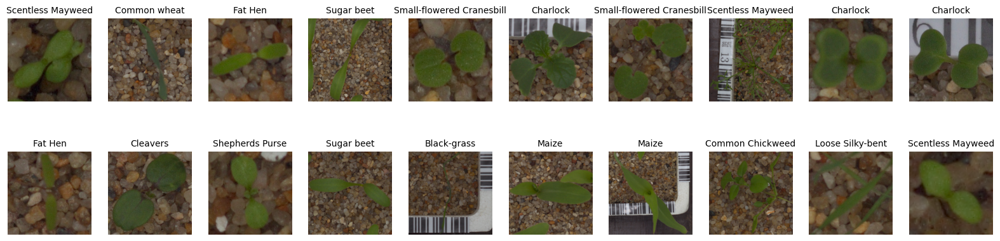

In [21]:
fig = plt.figure(figsize = (20, 5))

for i in range(20):
    img = Image.open(df_dataset_train.iloc[i]['path'])
    ax = fig.add_subplot(2, 10, i + 1)
    ax.imshow(img.convert('RGB'))
    title = dict_map_class_inverted[df_dataset_train.iloc[i]['label']]
    ax.set_title(title, fontsize=10)
    ax.axis('off')

## **Creamos los datasets para train, val y test**

In [22]:
train_tfdataset = get_dataset(
    df=df_dataset_train,
    input_size=(224,224),
    batch_size=32,
    shuffle=True,
    gray_scale=False,
    augmenter=True,
    num_aug=1,
)

train_tfdataset

Number of instances per label: 
0     523
1     488
2     412
3     396
4     380
5     312
6     308
7     229
8     210
9     184
10    176
11    176
Name: label, dtype: int64

Percentaje of instances per label: 
0     0.137849
1     0.128624
2     0.108593
3     0.104375
4     0.100158
5     0.082235
6     0.081181
7     0.060358
8     0.055351
9     0.048498
10    0.046389
11    0.046389
Name: label, dtype: float64
 > Shuffle
 > Augmentamos datos numero 1
 > Establecemos el batchsize


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>

In [23]:
valid_tfdataset = get_dataset(
    df=df_dataset_valid,
    input_size=(224,224),
    batch_size=32,
    shuffle=True,
    gray_scale=False,
    augmenter=False,
)

valid_tfdataset

Number of instances per label: 
0     131
1     123
2     104
3     100
4      95
5      78
6      77
7      58
8      53
9      47
11     45
10     45
Name: label, dtype: int64

Percentaje of instances per label: 
0     0.137029
1     0.128661
2     0.108787
3     0.104603
4     0.099372
5     0.081590
6     0.080544
7     0.060669
8     0.055439
9     0.049163
11    0.047071
10    0.047071
Name: label, dtype: float64
 > Shuffle
 > Establecemos el batchsize


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>

In [32]:
test_tfdataset = get_dataset(
    df=df_dataset_test,
    input_size=(224,224),
    batch_size=32,
    gray_scale=False,
    augmenter=False,
    test_set=True,
)

test_tfdataset

Number of instances per label: 
Unkown    794
Name: label, dtype: int64

Percentaje of instances per label: 
Unkown    1.0
Name: label, dtype: float64
 > Escala de grises
 > Establecemos el batchsize


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.float64, name=None))>

### Visualizamos los datasets preparado

No hacer si luego vamos a lanzar un entrenamiento, porque se iterar'an y al entrenar algunas muestras no estar;an y creo que va

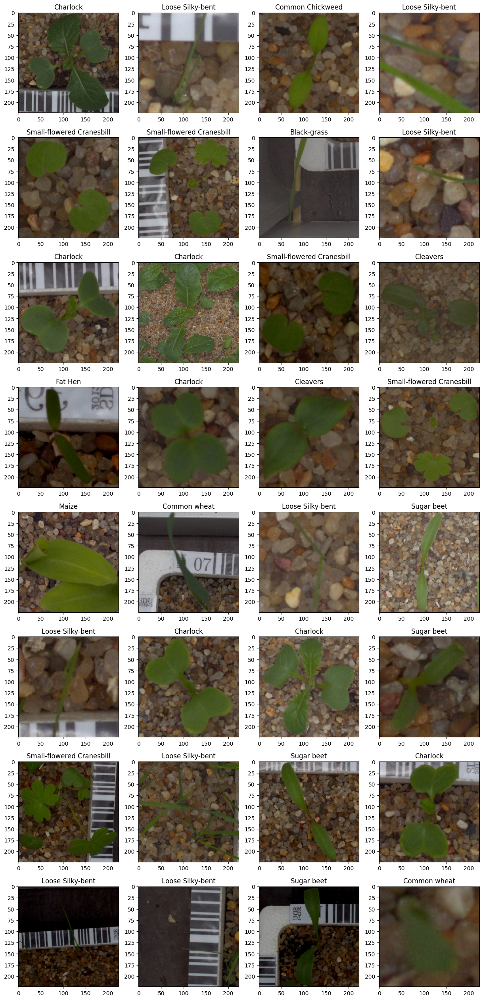

In [25]:
# TRAIN
batch = next(iter(train_tfdataset))
print
batches_card_np = batch[0].numpy()
y = batch[1].numpy()
images = list(iter(batches_card_np))

fig, axs = plt.subplots(math.ceil(len(images)/4), 4, figsize=(15, math.ceil(len(images)/4)*4))
axs = axs.ravel()

for i, image in enumerate(images):
    axs[i].imshow(image, cmap='gray')
    title = f"{dict_map_class_inverted[np.argmax(y[i])]}"
    axs[i].set_title(title)

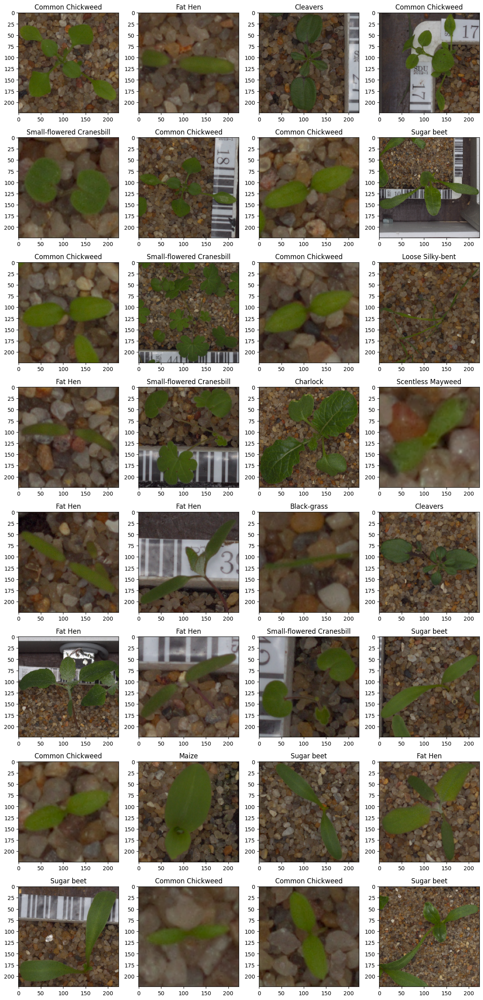

In [26]:
# VAL
batch = next(iter(valid_tfdataset))
print
batches_card_np = batch[0].numpy()
y = batch[1].numpy()
images = list(iter(batches_card_np))

fig, axs = plt.subplots(math.ceil(len(images)/4), 4, figsize=(15, math.ceil(len(images)/4)*4))
axs = axs.ravel()

for i, image in enumerate(images):
    axs[i].imshow(image, cmap='gray')
    title = f"{dict_map_class_inverted[np.argmax(y[i])]}"
    axs[i].set_title(title)

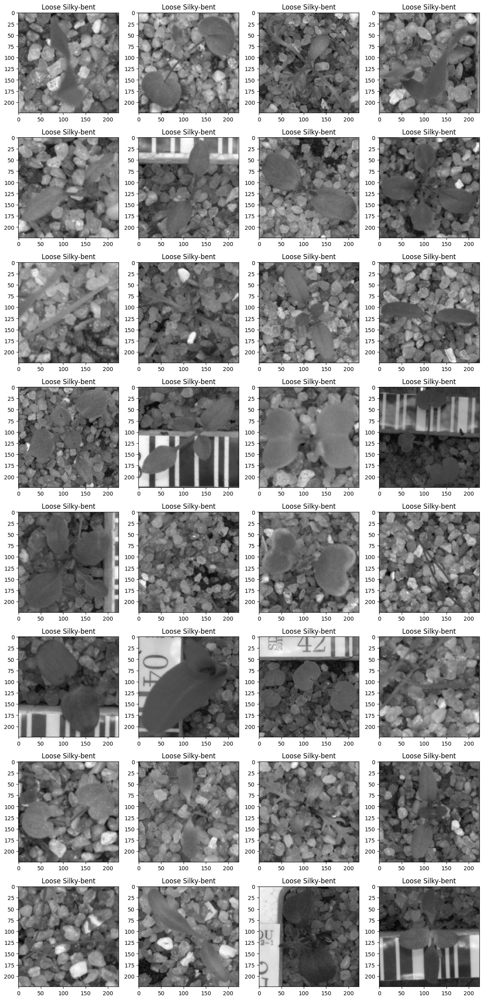

In [33]:
# TEST
batch = next(iter(test_tfdataset))
print
batches_card_np = batch[0].numpy()
y = batch[1].numpy()
images = list(iter(batches_card_np))

fig, axs = plt.subplots(math.ceil(len(images)/4), 4, figsize=(15, math.ceil(len(images)/4)*4))
axs = axs.ravel()

for i, image in enumerate(images):
    axs[i].imshow(image, cmap='gray')
    title = f"{dict_map_class_inverted[np.argmax(y[i])]}"
    axs[i].set_title(title)

## **Prueba entrenamiento**

In [30]:
# Cargamos el modelo de prueba
model = load_efficienNetV2(num_classes=12)
model.summary()

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(0.0001),
    metrics = ['acc']) 
                #tfam.F1Score(num_classes=5, name='f1_weig', threshold=0.5)])

monitoring_metric = 'val_acc'

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor = monitoring_metric, 
        mode = 'min', 
        patience = 20, 
        verbose=1,
        restore_best_weights=False),
    tf.keras.callbacks.ModelCheckpoint(
        filepath = 'models/CNN_source',
        monitor = monitoring_metric,
        mode = 'max',
        save_best_only = True,
        verbose = 1),
    ]

# Entrenamos el modelo
history = model.fit(train_tfdataset.repeat(),
        validation_data=valid_tfdataset,
        #class_weight = class_weight,
        epochs = 100,
        steps_per_epoch=20,
        callbacks = callbacks)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          0         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['normalization[0][0]']   

INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 75s 3s/step - loss: 4.8228 - acc: 0.1547 - val_loss: 2.9787 - val_acc: 0.1370
Epoch 2/100
20/20 [==============================] - ETA: 0s - loss: 3.6890 - acc: 0.1984
Epoch 2: val_acc did not improve from 0.13703
20/20 [==============================] - 43s 2s/step - loss: 3.6890 - acc: 0.1984 - val_loss: 2.9646 - val_acc: 0.0596
Epoch 3/100
20/20 [==============================] - ETA: 0s - loss: 3.0948 - acc: 0.2281
Epoch 3: val_acc improved from 0.13703 to 0.14226, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 61s 3s/step - loss: 3.0948 - acc: 0.2281 - val_loss: 3.0575 - val_acc: 0.1423
Epoch 4/100
20/20 [==============================] - ETA: 0s - loss: 2.6829 - acc: 0.3453
Epoch 4: val_acc improved from 0.14226 to 0.23536, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 62s 3s/step - loss: 2.6829 - acc: 0.3453 - val_loss: 2.7326 - val_acc: 0.2354
Epoch 5/100
20/20 [==============================] - ETA: 0s - loss: 2.3412 - acc: 0.3688
Epoch 5: val_acc did not improve from 0.23536
20/20 [==============================] - 44s 2s/step - loss: 2.3412 - acc: 0.3688 - val_loss: 2.5146 - val_acc: 0.2280
Epoch 6/100
20/20 [==============================] - ETA: 0s - loss: 1.9874 - acc: 0.4010
Epoch 6: val_acc improved from 0.23536 to 0.35669, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 61s 3s/step - loss: 1.9874 - acc: 0.4010 - val_loss: 2.0594 - val_acc: 0.3567
Epoch 7/100
20/20 [==============================] - ETA: 0s - loss: 1.6422 - acc: 0.4938
Epoch 7: val_acc improved from 0.35669 to 0.44561, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 62s 3s/step - loss: 1.6422 - acc: 0.4938 - val_loss: 1.6142 - val_acc: 0.4456
Epoch 8/100
20/20 [==============================] - ETA: 0s - loss: 1.4493 - acc: 0.5422
Epoch 8: val_acc did not improve from 0.44561
20/20 [==============================] - 46s 2s/step - loss: 1.4493 - acc: 0.5422 - val_loss: 1.8024 - val_acc: 0.4079
Epoch 9/100
20/20 [==============================] - ETA: 0s - loss: 1.3638 - acc: 0.5594
Epoch 9: val_acc improved from 0.44561 to 0.66527, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 63s 3s/step - loss: 1.3638 - acc: 0.5594 - val_loss: 0.9968 - val_acc: 0.6653
Epoch 10/100
20/20 [==============================] - ETA: 0s - loss: 1.2770 - acc: 0.5953
Epoch 10: val_acc did not improve from 0.66527
20/20 [==============================] - 46s 2s/step - loss: 1.2770 - acc: 0.5953 - val_loss: 1.4130 - val_acc: 0.5366
Epoch 11/100
20/20 [==============================] - ETA: 0s - loss: 1.1255 - acc: 0.6453
Epoch 11: val_acc improved from 0.66527 to 0.71130, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 64s 3s/step - loss: 1.1255 - acc: 0.6453 - val_loss: 0.9026 - val_acc: 0.7113
Epoch 12/100
20/20 [==============================] - ETA: 0s - loss: 0.9397 - acc: 0.6869
Epoch 12: val_acc improved from 0.71130 to 0.75418, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 63s 3s/step - loss: 0.9397 - acc: 0.6869 - val_loss: 0.7852 - val_acc: 0.7542
Epoch 13/100
20/20 [==============================] - ETA: 0s - loss: 0.9765 - acc: 0.6703
Epoch 13: val_acc did not improve from 0.75418
20/20 [==============================] - 46s 2s/step - loss: 0.9765 - acc: 0.6703 - val_loss: 0.8089 - val_acc: 0.7333
Epoch 14/100
20/20 [==============================] - ETA: 0s - loss: 0.8297 - acc: 0.7203
Epoch 14: val_acc improved from 0.75418 to 0.77510, saving model to models\CNN_source
INFO:tensorflow:Assets written to: models\CNN_source\assets


INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 65s 3s/step - loss: 0.8297 - acc: 0.7203 - val_loss: 0.6990 - val_acc: 0.7751
Epoch 15/100
20/20 [==============================] - ETA: 0s - loss: 0.7924 - acc: 0.7344
Epoch 15: val_acc did not improve from 0.77510
20/20 [==============================] - 47s 2s/step - loss: 0.7924 - acc: 0.7344 - val_loss: 0.8713 - val_acc: 0.7029
Epoch 16/100
20/20 [==============================] - ETA: 0s - loss: 0.7348 - acc: 0.7344
Epoch 16: val_acc did not improve from 0.77510
20/20 [==============================] - 48s 2s/step - loss: 0.7348 - acc: 0.7344 - val_loss: 0.7954 - val_acc: 0.7333
Epoch 17/100
20/20 [==============================] - ETA: 0s - loss: 0.7397 - acc: 0.7453
Epoch 17: val_acc did not improve from 0.77510
20/20 [==============================] - 47s 2s/step - loss: 0.7397 - acc: 0.7453 - val_loss: 0.9340 - val_acc: 0.6789
Epoch 18/100
20/20 [==============================] - ETA: 0s - loss: 0.6400 - acc: 0.7700
Epoch 18: val_acc i

INFO:tensorflow:Assets written to: models\CNN_source\assets


20/20 [==============================] - 64s 3s/step - loss: 0.6400 - acc: 0.7700 - val_loss: 0.4359 - val_acc: 0.8577
Epoch 19/100
20/20 [==============================] - ETA: 0s - loss: 0.6395 - acc: 0.7719
Epoch 19: val_acc did not improve from 0.85774
20/20 [==============================] - 47s 2s/step - loss: 0.6395 - acc: 0.7719 - val_loss: 1.0201 - val_acc: 0.6674
Epoch 20/100
20/20 [==============================] - ETA: 0s - loss: 0.5397 - acc: 0.8062
Epoch 20: val_acc did not improve from 0.85774
20/20 [==============================] - 47s 2s/step - loss: 0.5397 - acc: 0.8062 - val_loss: 1.2792 - val_acc: 0.5743
Epoch 21/100
20/20 [==============================] - ETA: 0s - loss: 0.6067 - acc: 0.7906
Epoch 21: val_acc did not improve from 0.85774
20/20 [==============================] - 47s 2s/step - loss: 0.6067 - acc: 0.7906 - val_loss: 0.4976 - val_acc: 0.8326
Epoch 22/100
20/20 [==============================] - ETA: 0s - loss: 0.5488 - acc: 0.8109
Epoch 22: val_acc d

In [31]:
predictions = model.predict(test_tfdataset)

25/25 [==============================] - 10s 374ms/step
